<center> <img src="https://miro.medium.com/v2/resize:fit:1250/format:webp/1*QgI1t-7yJApi4vQigFgsLQ.jpeg" width=25% > </center>

<br><br>

<center> 
    <font size="6">Final Lab (Part 1): Keypoint Detection, Bag of Visual Words and Image Classification</font>
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59PM, October 18, 2024 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>TA's: Vlad, Matey & Antonios</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID:  15388867\
Student1 Name: Jose Garcia

Student2 ID: 15735664\
Student2 Name: Lisanne Wallaard

Student3 ID: 11307943\
Student3 Name: Julio Smidi

</center>

### **General Guidelines**

Your code must be handed in this Jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Final Lab (Part 1) Assignment. Please also fill out your names and IDs above.

For full credit, make sure your notebook follows these guidelines:

- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Understand the problem as much as you can. When answering a question, provide evidence (qualitative and/or quantitative results, references to papers, figures, etc.) to support your arguments. Not everything might be explicitly asked for, so think about what might strengthen your arguments to make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Add a number, a title, and, if applicable, the name and unit of variables in a table, and name and unit of axes and legends in a figure.

**Late submissions are not allowed.** Assignments submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance to avoid last-minute system failure issues.

**Environment:** Since this is a project-based assignment, you are free to use any feature descriptor and machine learning tools (e.g., K-means, SVM). You should use Python for your implementation. You are free to use any Python library for this assignment, but make sure to provide a conda environment file!

**Plagiarism Note:** Keep in mind that plagiarism (submitted materials which are not your work) is a serious offense and any misconduct will be addressed according to university regulations. This includes using generative tools such as ChatGPT.

**Ensure that you save all results/answers to the questions (even if you reuse some code).**

### **Report Preparation**

Your tasks include the following:

1. **Report Preparation:** For both parts of the final project, students are expected to prepare a report. The report should include all details on implementation approaches, analysis of results for different settings, and visualizations illustrating experiments and performance of your implementation. Grading will be based on the report, so it should be as self-contained as possible. If the report contains faulty results or ambiguities, TAs can refer to your code for clarification. Only section 10 of this notebook should **not** be included in the report.

2. **Explanation of Results:** Do not just provide numbers without explanation. Discuss different settings to show your understanding of the material and processes involved.

3. **Quantitative Evaluation:** For quantitative evaluation, you are expected to provide the results based on the mAP (mean Average Precision) metric. You should report the mAP for each experimental setup. 

4. **Qualitative Evaluation:** For qualitative evaluation, you are expected to visualize the top-5 and bottom-5 ranked test images (based on classifier confidence for the target class) per setup. Provide a figure for each experimental setup Visual elements such as charts, graphs, and plots are always useful. Keep this in mind while writing your reports.

5. **Aim:** Understand the basic Image Classification pipeline using a traditional Bag of Visual Words method.

6. **Working on Assignments:** Students should work in assigned groups for **two** weeks. Any questions can be discussed on ED.

    - **Submission:** Submit your source code and report together in a zip file (`ID1_ID2_ID3_part1.zip`). The report should be a maximum of 10 pages (single-column, including tables and figures, excluding references and appendix). Express thoughts concisely. Tables and figures must be accompanied by a description. Number them and, if applicable, name variables in tables, and label axes in figures.

7. **Hyperparameter Search:** In your experiments, remember to perform a hyperparameter search to find the optimal settings for your classifier. Clearly document the search process, the parameters you explored, and how they influenced the performance of your model.

8. **Format and Testing:** The report should be in **PDF format**, and the code in **.ipynb format**. Test that all functionality works as expected in the notebook.

### **Overview**

- [Section 1: Data Preparation (0 points)](#section-1)
- [Section 2: Keypoint Detection and Feature Extraction (3 points)](#section-2)
- [Section 3: Building the Visual Vocabulary (3 points)](#section-3)
- [Section 4: Encoding Train Image Features (3 points)](#section-4)
- [Section 5: Visualizing the Bag of Visual Words for Each Class (3 points)](#section-5)
- [Section 6: Encoding Test Image Features (0 points)](#section-6)
- [Section 7: Training the Classifiers (5 points)](#section-7)
- [Section 8: Evaluating the Classifiers (12 points)](#section-8)
- [Section 9: Hyperparameter Search (16 points)](#section-9)
- [Section 10: Using CLIP for Image Classification (5 points)](#section-10)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

### **Section 1: Data Preparation (0 points)**

The goal of this lab is to implement an image classification system that can identify objects from a given set of classes. You will perform a 5-class image classification using a bag-of-words approach ([reference](http://www.robots.ox.ac.uk/~az/icvss08_az_bow.pdf)). The classes for this task are:

1. **Frog**
2. **Automobile**
3. **Bird**
4. **Cat**
5. **Deer**

The [CIFAR-10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html) will be used for this task. This dataset contains 32x32 pixel RGB images, divided into sub-directories with 5000 training images and 1000 test images for each class.

The dataset will be automatically downloaded using the code provided in this notebook. You will need to perform training on the training set, which will later be divided into two subsets: one for building the visual vocabulary and another for training the classifier. Using more samples for training generally results in better performance. However, if computational resources are limited, you may use fewer training images to save time, as long as at least 500 images per class are included.

The system must be tested using the specified subset of test images. Use all 1000 test images (per class) to observe the full performance of the model. Ensure that test images are excluded from training to maintain a fair comparison.

In [3]:
import cv2
import torch
import numpy as np
import torchvision
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset, Subset

# Define total train and test sizes
total_train_size = 5000  # Default value for total training images
total_test_size = 1000   # Default value for total test images

# Define batch sizes for DataLoader
train_batch_size = total_train_size
test_batch_size = total_test_size

# Define the number of Visual Words
num_of_visual_words = 1000  # Default value for number of visual words

# Number of classes
num_classes = 5

# Compute images per class for training and testing
images_per_class_train = total_train_size // num_classes  # e.g., 5000 // 5 = 1000 per class
images_per_class_test = total_test_size // num_classes    # e.g., 1000 // 5 = 200 per class

# Define the transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  
])

# Define the class indices for the 5 selected classes: frog, automobile, bird, cat, and deer
selected_classes = [6, 1, 2, 3, 4]  # 6: frog, 1: automobile, 2: bird, 3: cat, 4: deer
class_to_label = {orig_class: new_label for new_label, orig_class in enumerate(selected_classes)}

# Load the CIFAR-10 training set
train_set = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)

# Function to filter and remap dataset
def filter_dataset(dataset, images_per_class, selected_classes, class_to_label):
    selected_indices = []
    class_counts = {class_idx: 0 for class_idx in selected_classes}
    remapped_labels = []

    for idx, (image, label) in enumerate(dataset):
        if label in selected_classes and class_counts[label] < images_per_class:
            selected_indices.append(idx)
            remapped_labels.append(class_to_label[label])
            class_counts[label] += 1

            # Stop if we have enough samples for each class
            if all(count >= images_per_class for count in class_counts.values()):
                break

    filtered_dataset = Subset(dataset, selected_indices)
    return filtered_dataset, remapped_labels

# Filter and remap training set
filtered_train_set, train_mapped_labels = filter_dataset(train_set, images_per_class_train, selected_classes, class_to_label)

# Load the CIFAR-10 test set
test_set = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# Filter and remap test set
filtered_test_set, test_mapped_labels = filter_dataset(test_set, images_per_class_test, selected_classes, class_to_label)

# Create data loaders for the filtered datasets
train_data_loader = DataLoader(filtered_train_set, batch_size=train_batch_size, shuffle=False)
test_data_loader = DataLoader(filtered_test_set, batch_size=test_batch_size, shuffle=False)

# Extract all training data and remapped labels
train_images, _ = next(iter(train_data_loader))
train_labels = torch.tensor(train_mapped_labels)

train_images = train_images.permute(0, 2, 3, 1)
print(f"Filtered train data: {train_images.shape}")
print(f"Filtered train labels: {train_labels.shape}")

# Extract all test data and remapped labels
test_images, _ = next(iter(test_data_loader))
test_labels = torch.tensor(test_mapped_labels)

test_images = test_images.permute(0, 2, 3, 1)
print(f"Filtered test data: {test_images.shape}")
print(f"Filtered test labels: {test_labels.shape}")

Files already downloaded and verified
Files already downloaded and verified
Filtered train data: torch.Size([5000, 32, 32, 3])
Filtered train labels: torch.Size([5000])
Filtered test data: torch.Size([1000, 32, 32, 3])
Filtered test labels: torch.Size([1000])


<a id="section-2"></a>
### **Section 2: Keypoint Detection and Feature Extraction (3 points)**

In this section, you will work on detecting keypoints and extracting features from the dataset. Your task is to use **two different feature extraction techniques** to identify keypoints in the images. Visualize two images from each of the five classes (Frog, Automobile, Bird, Cat, Deer) for both feature extraction techniques. For each image, draw circles around the detected keypoints that represent their size.

This step is essential to understand how different feature extractors behave across various classes, setting the foundation for further analysis and classification in later steps.

**Hint:** You can use the OpenCV library to detect keypoints and extract features. You can also upscale the images to improve the visualization of the keypoints.

In [4]:
def fix_tensor(tensor):
    """
    Given a tensor that ranges from -1 to 1, scale it so it ranges from to 0 - 255
    """
    return np.interp(tensor.numpy(), (-1, 1), (0, 255)).astype(np.uint8)

In [5]:
# From Lecture 8, options for detecting keypoints and extracting features: SIFT, ORB, SURF, FAST, etc.
# We will use SIFT and ORB for this assignment
def get_image_keypoints_and_descriptors(img, method='sift'):
    """
    Given an input image, find and return its keypoints and features.

    Args:
        image: The image in grayscale

    Returns:
        keypoints_image: Keypoints detected in the first image
    """

    # turn the image to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # create the extractor object
    if method == 'sift':
        extractor = cv2.SIFT_create()
    elif method == 'orb':
        extractor = cv2.ORB_create()

    img_keypoints, img_descriptors = extractor.detectAndCompute(img_gray, None)

    return img_keypoints, img_descriptors

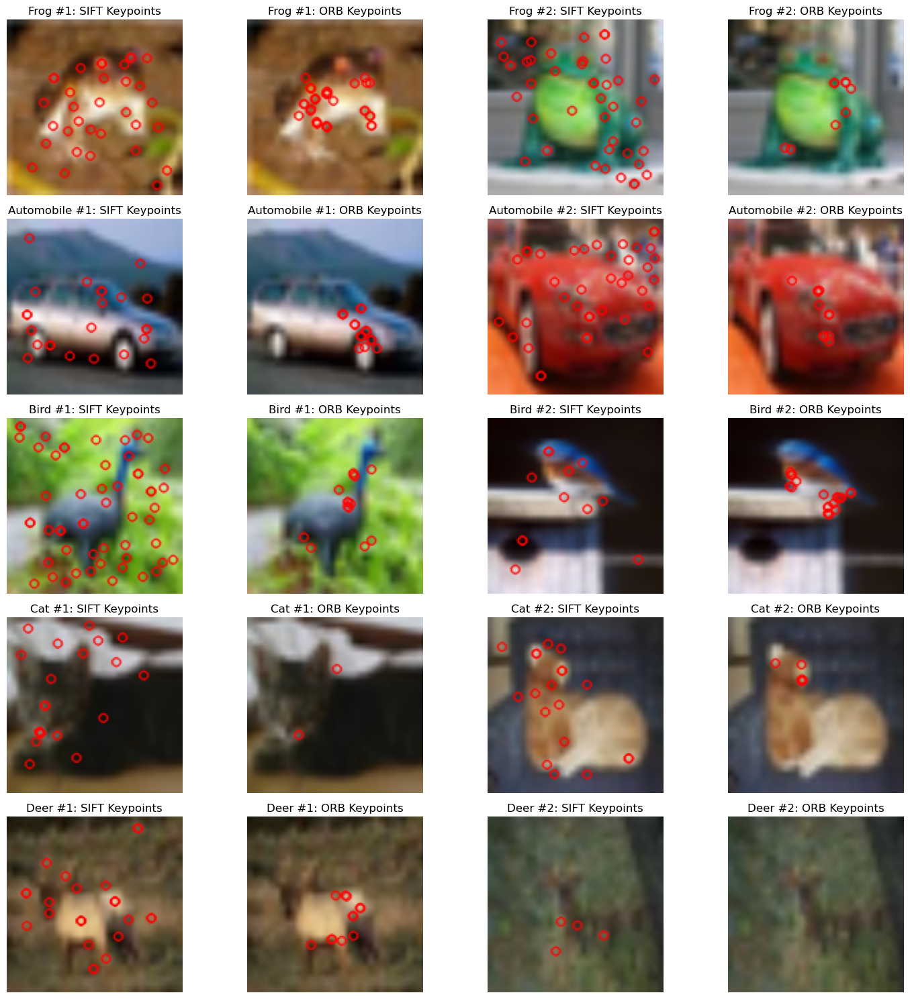

In [6]:

# Display the first two images of each class
class_names = ['Frog', 'Automobile', 'Bird', 'Cat', 'Deer']

fig, axes = plt.subplots(num_classes, 4, figsize=(15, 15))

for i, class_name in enumerate(class_names):

    class_images = train_images[train_labels == i][:2]

    for n, image in enumerate(class_images):

        image = cv2.resize(fix_tensor(image), (128, 128))
        
        sift_keypoints, _ = get_image_keypoints_and_descriptors(image, 'sift')
        orb_keypoints, _ = get_image_keypoints_and_descriptors(image, 'orb')

        # Draw the keypoints on the image
        image_w_sift_keypoints = cv2.drawKeypoints(image, sift_keypoints, 0, (255,0,0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)
        image_w_orb_keypoints = cv2.drawKeypoints(image, orb_keypoints, 0, (255,0,0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)

        x_pos = n * 2

        axes[i, x_pos].imshow(image_w_sift_keypoints)
        axes[i, x_pos].set_title(f"{class_name} #{n+1}: SIFT Keypoints")
        axes[i, x_pos].axis('off')

        axes[i, x_pos + 1].imshow(image_w_orb_keypoints)
        axes[i, x_pos + 1].set_title(f"{class_name} #{n+1}: ORB Keypoints")
        axes[i, x_pos + 1].axis('off')

plt.tight_layout()
plt.show()

<a id="section-3"></a>
### **Section 3: Building the Visual Vocabulary (3 points)**

In this section, the task is to create a visual vocabulary by clustering feature descriptors extracted from the images using K-Means. Each cluster center in this vocabulary will represent a visual word. Use the two different extraction techniques you implemented to extract descriptors from a subset of training images that includes all categories, and then apply K-Means clustering to build the vocabulary. The number of clusters is fixed at 1000, but you can experiment with different values when you are tuning the hyperparameters in section 9.

To examine the effect of different amounts of training data, build separate visual vocabularies using 30%, 40%, and 50% subsets of the training images. For faster clustering, the `faiss` library can be used, as it provides an efficient implementation of K-Means. Then, visualize the first 10 clusters for each feature extraction technique and each subset size using PCA to reduce the dimensions to 2D.

**Hints:**
1. Begin by debugging the code with a small number of input images to ensure it functions correctly before running it on larger datasets.
2. If the `faiss` library is not available, K-Means clustering can also be performed using the `sklearn` or `scipy` libraries.
3. For visualization, use PCA from `sklearn.decomposition` to reduce the high-dimensional descriptors to 2D. Display up to 10 clusters in the scatter plot to maintain clarity.

In [7]:
import faiss
import random
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

In [8]:
# Function to apply Kmeans clustering and form visual dictionaries
def build_visual_vocabulary(descriptors, num_clusters=1000, mode='faiss'):
    if mode == 'faiss':
        kmeans = faiss.Kmeans(descriptors.shape[1], num_clusters, niter=20)
        kmeans.train(descriptors)
    elif mode == 'sklearn':
        kmeans = KMeans(n_clusters=num_clusters, random_state=0)
        kmeans.fit(descriptors)

    return kmeans

In [9]:
def get_descriptors_and_clusters(images, num_clusters=1000, mode='faiss'):
    """ Extracts descriptors and clusters from the given images 
    
    Args:
        images: The images to extract descriptors and clusters from
        num_clusters: The number of clusters to use for the visual vocabulary
        mode: The mode to use for clustering ('faiss' or 'sklearn')
        
    Returns: 
        sift_descriptors: The SIFT descriptors extracted from the images
        orb_descriptors: The ORB descriptors extracted from the images
        sift_clusters: The SIFT clusters formed from the descriptors
        orb_clusters: The ORB clusters formed from the descriptors
    
    """
    sift_descriptors = []
    orb_descriptors = []

    for img in images:

        img = cv2.resize(fix_tensor(img), (128, 128))
        _, img_sift_descriptors = get_image_keypoints_and_descriptors(img, method='sift')
        _, img_orb_descriptors = get_image_keypoints_and_descriptors(img, method='orb')

        if img_sift_descriptors is not None:
            sift_descriptors.append(img_sift_descriptors)

        if img_orb_descriptors is not None:
            orb_descriptors.append(img_orb_descriptors)
            
    sift_descriptors = np.vstack(sift_descriptors)
    orb_descriptors = np.vstack(orb_descriptors)

    sift_clusters = build_visual_vocabulary(sift_descriptors, num_clusters, mode)
    orb_clusters = build_visual_vocabulary(orb_descriptors, num_clusters, mode)
    
    return sift_descriptors, orb_descriptors, sift_clusters, orb_clusters

In [10]:
# Function to visualize clusters using PCA
def visualize_clusters(descriptors_list, kmeans_list, percentage, num_clusters=10, mode='faiss'):

    fig, axes = plt.subplots(1, 2, figsize=(10, 6))

    pca = PCA(n_components=2)

    for n, descriptor in enumerate(descriptors_list):

        reduced_descriptors = pca.fit_transform(descriptor)

        for i in range(num_clusters):

            if mode == 'faiss':
                cluster_points = reduced_descriptors[kmeans_list[n].index.search(descriptor, 1)[1].flatten() == i]
                cluster_centers = pca.transform(kmeans_list[n].centroids)
            elif mode == 'sklearn':
                cluster_points = reduced_descriptors[kmeans_list[n].labels_ == i]
                cluster_centers = pca.transform(kmeans_list[n].cluster_centers_)

            axes[n].scatter(cluster_points[:, 0], cluster_points[:, 1], label=f"Cluster {i + 1}", alpha=0.5)
            axes[n].scatter(cluster_centers[i, 0], cluster_centers[i, 1], color='red', marker='x', s=50, linewidths=1)

        axes[n].scatter([], [], color='red', marker='x', s=50, linewidths=1, label='Cluster Center')
        axes[n].set_title(f"{'SIFT' if n == 0 else 'ORB'} Clusters")
        axes[n].grid(True)

        if n == 1:
            axes[n].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    fig.suptitle(f"Visualization of {num_clusters} Clusters: {percentage * 100}% of Training Data")
    plt.tight_layout()
    plt.show()

WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points
WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


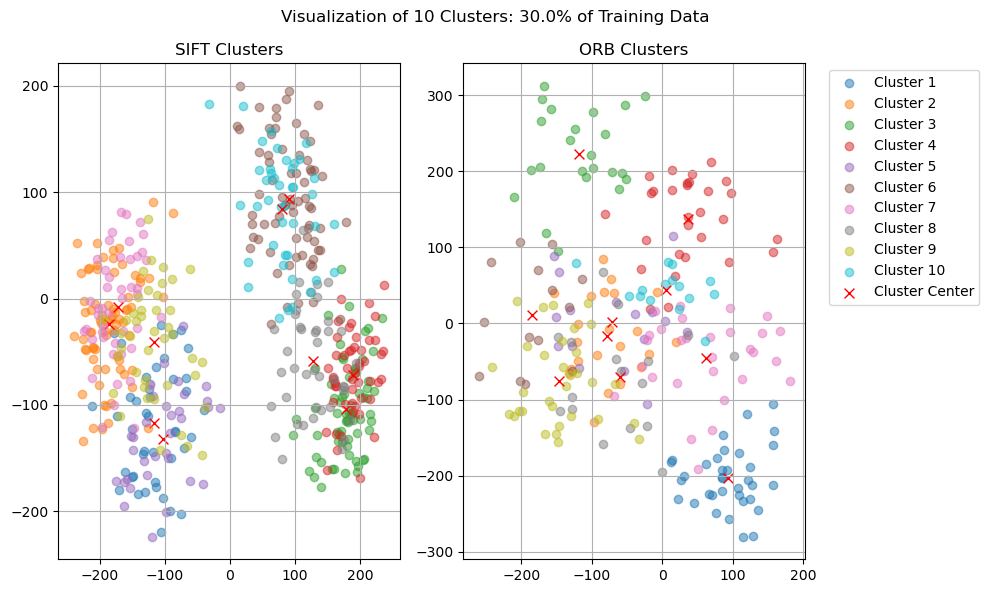

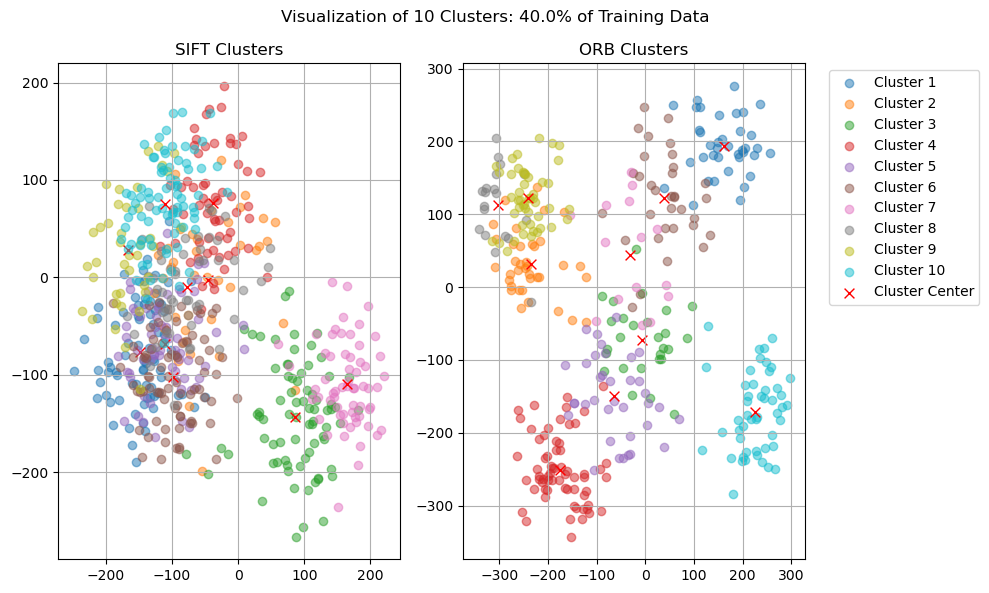

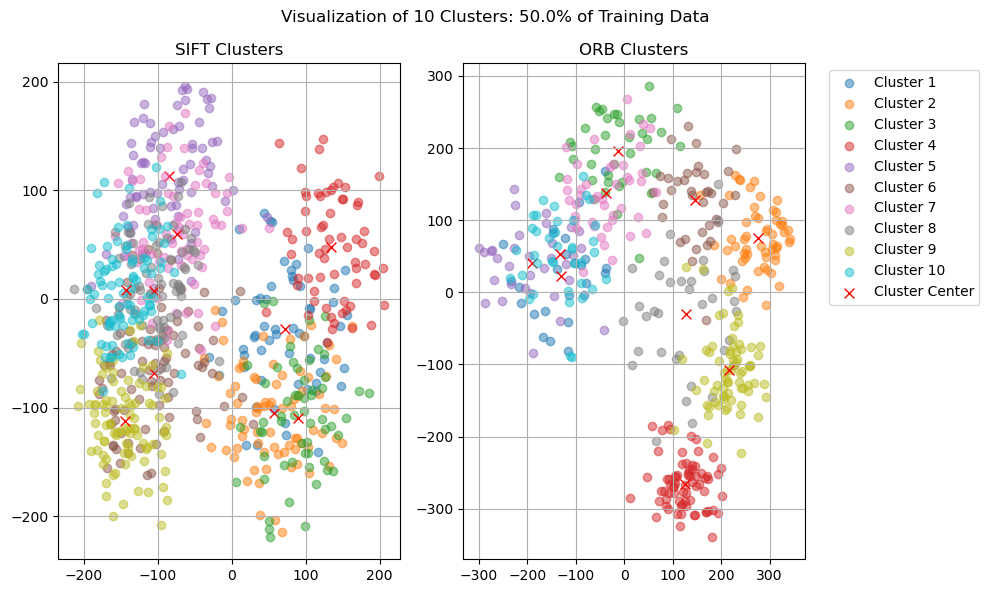

In [11]:
cluster_mode = 'faiss'
clusters_to_show = 10

train_images_30_bow, train_images_70_svm, train_labels_30_bow, train_labels_70_svm = train_test_split(train_images, train_labels, test_size=0.7, random_state=42)
train_images_40_bow, train_images_60_svm, train_labels_40_bow, train_labels_60_svm = train_test_split(train_images, train_labels, test_size=0.6, random_state=42)
train_images_50_bow, train_images_50_svm, train_labels_50_bow, train_labels_50_svm = train_test_split(train_images, train_labels, test_size=0.5, random_state=42)

sift_descriptors_30, orb_descriptors_30, sift_clusters_30, orb_clusters_30 = get_descriptors_and_clusters(train_images_30_bow, num_of_visual_words, cluster_mode)
sift_descriptors_40, orb_descriptors_40, sift_clusters_40, orb_clusters_40 = get_descriptors_and_clusters(train_images_40_bow, num_of_visual_words, cluster_mode)
sift_descriptors_50, orb_descriptors_50, sift_clusters_50, orb_clusters_50 = get_descriptors_and_clusters(train_images_50_bow, num_of_visual_words, cluster_mode)

visualize_clusters([sift_descriptors_30, orb_descriptors_30], [sift_clusters_30, orb_clusters_30], 0.3, clusters_to_show, cluster_mode)
visualize_clusters([sift_descriptors_40, orb_descriptors_40], [sift_clusters_40, orb_clusters_40], 0.4, clusters_to_show, cluster_mode)
visualize_clusters([sift_descriptors_50, orb_descriptors_50], [sift_clusters_50, orb_clusters_50], 0.5, clusters_to_show, cluster_mode)

<a id="section-4"></a>
### **Section 4: Encoding Train Image Features (3 points)**

In this section, the task is to encode image features using the visual vocabulary created earlier. Each image will be represented as a histogram of visual words, reflecting the frequency of each visual word in the image. This representation will allow for comparing images based on their visual content.

To encode an image, identify the nearest visual word (cluster center) for each feature descriptor extracted from the image. Construct a histogram that counts the occurrences of each visual word within the image. The final output will be a collection of histograms, one for each image, where each histogram serves as the feature representation of that image. Once again,  Use the two different extraction techniques you implemented to extract descriptors from the images. Then, encode the images using the visual vocabulary created in the previous step.

**Hint:** Utilize the `faiss` library for efficient nearest neighbor search when assigning each descriptor to the nearest cluster center in the visual dictionary. If `faiss` is not available, consider using other libraries, such as `scikit-learn`, for this step. Once the histograms are obtained, they will be used for further tasks, such as training a classifier. For now, perform the encoding only for the training set.

In [12]:
from sklearn.preprocessing import normalize
from sklearn.model_selection import train_test_split

def images_to_histograms(images, clusters, method, num_clusters, mode='faiss'):
    """
    Encode image features using a visual vocabulary and represent them as histograms of visual words, reflecting the frequency of each visual word in the image.    
    
    Args:
        images: A list of images
        method: The feature extraction technique to use ('sift' or 'orb')
        clusters: The clusters in which the nearest neighbour search will be performed
        num_clusters: The number of clusters
        mode: The mode to use for nearest neighbour search ('faiss', and if not available 'scikit-learn')
        
    Returns:
        histogram_list: A list of histograms of visual words for each image.
    """
    histogram_list = []

    for image in images:   
        
        image = cv2.resize(fix_tensor(image), (128, 128))
        # Obtain the descriptors for the image using the given method
        _, descriptors = get_image_keypoints_and_descriptors(image, method=method)
        
        histogram = np.zeros(num_clusters)
        if descriptors is None:
            histogram_list.append(histogram)
            continue

        # Find the nearest cluster for each descriptor given the mode
        if mode == 'faiss':
            _, nearest_word = clusters.index.search(descriptors, 1)  
            nearest_word = nearest_word.flatten()
        elif mode == 'sklearn':
            nearest_word = clusters.predict(descriptors)  
            
        # Update the histogram with the frequency of each visual word
        for word in nearest_word:
            histogram[word] += 1

        # Normalize the histogram to compare images with different numbers of keypoints
        histogram = normalize(histogram.reshape(1, -1), norm='l2').flatten()        
        
        histogram_list.append(histogram)

    return np.array(histogram_list)

print("Encode training images features using the SIFT technique")
train_histograms_sift = images_to_histograms(train_images, sift_clusters_50, 'sift', num_of_visual_words, cluster_mode)

print("Encode training images features using the ORB technique")
train_histograms_orb = images_to_histograms(train_images, orb_clusters_50, 'orb', num_of_visual_words, cluster_mode)

Encode training images features using the SIFT technique
Encode training images features using the ORB technique


<a id="section-5"></a>
### **Section 5: Visualizing the Bag of Visual Words for Each Class (3 points)**

In this section, the task is to visualize the Bag of Visual Words for each class using the histograms generated in the previous step. The goal is to plot the mean histogram of visual words for each class, showing the distribution of visual words across the different categories in the training set.

Use the two different extraction techniques you implemented for this visualization. For each technique, calculate the mean histogram for each class and create a bar plot to display these histograms. Ensure that the plots are labeled clearly with the class names and feature descriptor types.

In [11]:
from collections import defaultdict

def visualize_bow_per_class(histograms, labels, num_classes, num_clusters, class_names, method):
    """
    
    Args:
        histograms: A list of histograms of visual words for each image
        labels: A list of labels for each image in the histogram
        num_classes: The number of classes
        num_clusters: The number of clusters
        class_names: A list of class names
        method: The feature extraction technique used ('sift' or 'orb')

    """
    histogram_dict = defaultdict(lambda: np.zeros(num_clusters))     
    counts_dict = defaultdict(int)

    # Sum the histograms for each class
    for histogram, label in zip(histograms, labels):
        histogram_dict[label.item()] += histogram
        counts_dict[label.item()] += 1

    # Calculate the mean histogram for each class
    mean_histogram_dict = {label: histogram_dict[label] / counts_dict[label]
                       for label in range(num_classes)}
    
    # Plot the mean histograms for each class
    fig, axes = plt.subplots(num_classes, 1, figsize=(15, 20))

    for i, class_name in enumerate(class_names):
        axes[i].bar(range(num_clusters), mean_histogram_dict[i])
        axes[i].set_title(f"Class: {class_name}, Method: {method}")
        axes[i].set_ylabel("Mean Frequency")
        axes[i].set_xlabel("Visual Words (Clusters)")
    
    # axes[-1].set_xlabel("Visual Words (Clusters)")
    
    plt.tight_layout()
    plt.show()

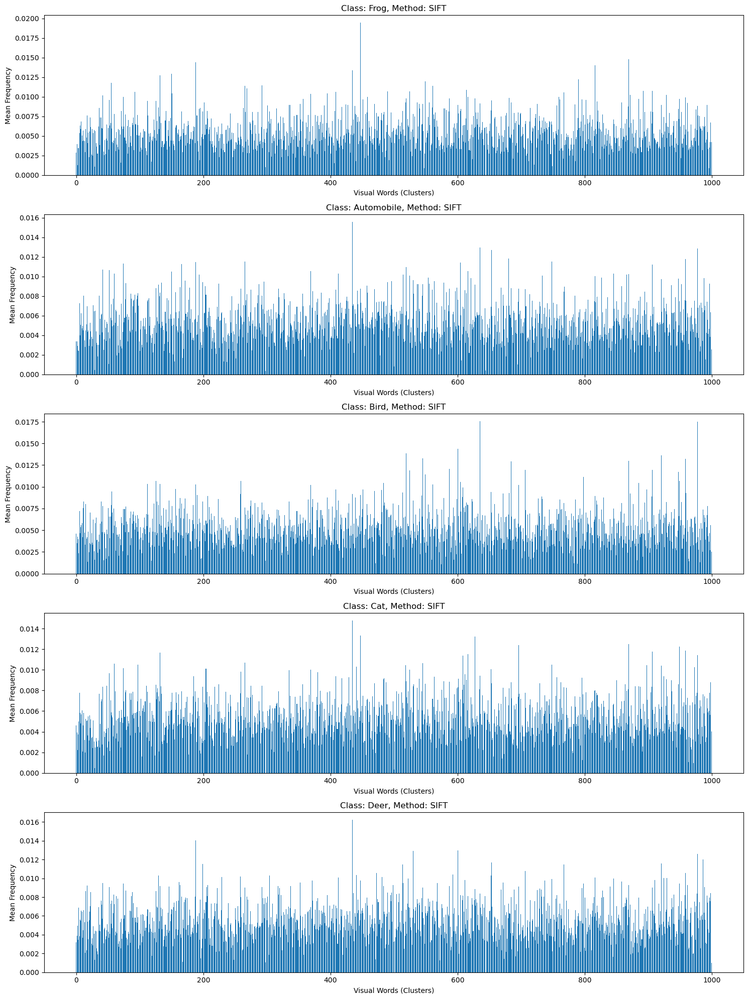

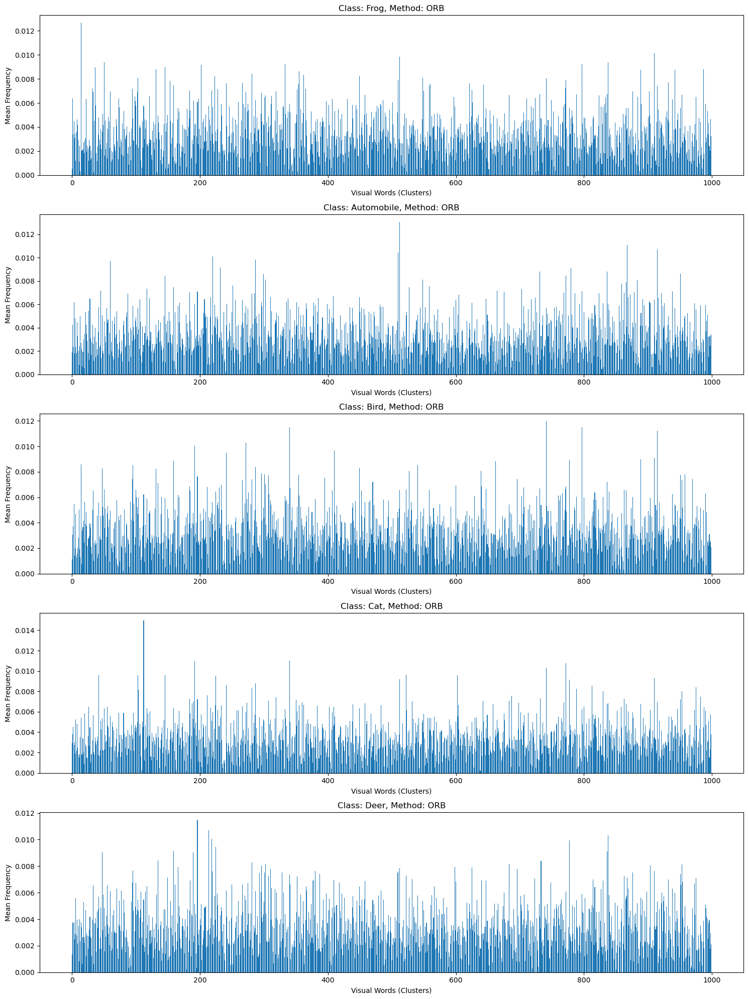

In [12]:

# Visualize the BoW histograms using SIFT
visualize_bow_per_class(train_histograms_sift, train_labels_50_bow, num_classes, num_of_visual_words, class_names, method='SIFT')
# Visualize the BoW histograms using ORB
visualize_bow_per_class(train_histograms_orb, train_labels_50_bow, num_classes, num_of_visual_words, class_names, method='ORB')


<a id="section-6"></a>
### **Section 6: Encoding Test Image Features (0 points)**

In this section, the task is to encode the test image features using the visual vocabulary created from the training set. Similar to the previous encoding step, each test image will be represented as a histogram of visual words, which will then be used for evaluating classification performance.

Use the same two feature extraction techniques you selected earlier. Extract keypoints and descriptors for the test images, then encode these images using the visual vocabulary. This will allow you to compare the encoded features of test images against those of the training set.

**Hint:** Reuse the functions developed earlier for extracting keypoints, descriptors, and encoding images. Ensure that you use the visual vocabulary constructed with the training images for consistency.

In [13]:

print("Encode test images features using the SIFT technique")
test_histograms_sift = images_to_histograms(test_images, sift_clusters_50, 'sift', num_of_visual_words, cluster_mode)

print("Encode test images features using the ORB technique")
test_histograms_orb = images_to_histograms(test_images, orb_clusters_50, 'orb', num_of_visual_words, cluster_mode)

Encode test images features using the SIFT technique
Encode test images features using the ORB technique


<a id="section-7"></a>
### **Section 7: Training the Classifiers (5 points)**

In this section, the task is to create two one-vs-rest (OvR) SVM classifiers using the 50% of the training data that was **not** used for creating the visual dictionary. This ensures that the classifiers are trained on a different subset of data, providing a more robust evaluation of the visual vocabulary's effectiveness.

For each of the two selected feature extraction techniques, create one-vs-rest classifiers for all classes. For now, use default parameter values when training the classifiers; you will experiment with different hyperparameters in later steps.

**Note:** Training an OvR classifier can take around 5 to 7 minutes. Therefore, it's advisable to first test your code with a smaller subset of the training data to verify that your implementation works correctly before running it on the full dataset.

In [14]:
print("Encode training images features using the SIFT technique")
train_histograms_sift_svm = images_to_histograms(train_images_50_svm, sift_clusters_50, 'sift', num_of_visual_words, cluster_mode)

print("Encode training images features using the ORB technique")
train_histograms_orb_svm = images_to_histograms(train_images_50_svm, orb_clusters_50, 'orb', num_of_visual_words, cluster_mode)

Encode training images features using the SIFT technique
Encode training images features using the ORB technique


In [17]:
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier

In [16]:
print("Train (OvR) SVM on SIFT features")
ovr_svm_sift = OneVsRestClassifier(SVC(kernel='linear', random_state=42))
ovr_svm_sift.fit(train_histograms_sift_svm, train_labels_50_svm)

Train (OvR) SVM on SIFT features


OneVsRestClassifier(estimator=SVC(kernel='linear', random_state=42))

In [17]:
print("Train (OvR) SVM on ORB features")
ovr_svm_orb = OneVsRestClassifier(SVC(kernel='linear', random_state=42))
ovr_svm_orb.fit(train_histograms_sift_svm, train_labels_50_svm)

Train (OvR) SVM on ORB features


OneVsRestClassifier(estimator=SVC(kernel='linear', random_state=42))

<a id="section-8"></a>
### **Section 8: Evaluating the Classifiers (12 points)**

In this section, you will evaluate the performance of your one-vs-rest (OvR) SVM classifiers on the test data. The goal is to classify each test image using each binary classifier and rank the images based on the classification scores, resulting in a ranked list of images for each class. Ideally, images belonging to the target class should appear at the top of the respective list. To conduct this evaluation, use the test image histograms generated earlier for the two selected feature extraction techniques. Classify each test image with each classifier, rank them based on their confidence scores, and then compute the Mean Average Precision (mAP) across all classes. The mAP for a single class $c$ is defined as:

$
\text{mAP}_c = \frac{1}{m_c} \sum_{i=1}^{n} \frac{f_c(x_i)}{i}
$

where:
- $n$ is the total number of images ($n = 50 \times 5 = 250$),
- $m_c$ is the number of images of class $c$ ($m_c = 50$),
- $x_i$ is the $i^{th}$ image in the ranked list $X = \{ x_1, x_2, \dots, x_n \}$,
- $f_c$ is a function that returns the number of images of class $c$ in the first $i$ images if $x_i$ is of class $c$, and 0 otherwise.

For instance, if you are retrieving images of class "R" and the sequence of ranked images is $[R, R, T, R, T, T, R, T]$, then $n = 8$, $m_c = 4$, and:

$
AP = \frac{1}{4} \left( \frac{1}{1} + \frac{2}{2} + \frac{0}{3} + \frac{3}{4} + \frac{0}{5} + \frac{0}{6} + \frac{4}{7} + \frac{0}{8} \right).
$

In addition to the quantitative analysis, perform a qualitative analysis by visualizing the top-5 and bottom-5 ranked test images.

In [13]:
def visualize_images_class(images, ranked_i, scores, c):
    """ Visualises the top-5 and bottom-5 ranked images for a certain class   

    Args:
        images: A list of test images
        ranked_i: A list of indices of the images ranked by confidence score for a class
        scores: A list of confidence scores of a certain class for each image
        c: The class to visualise the images for
    """
    
    print(f"Class {c}: Top-5 Images:")
    top5_i = ranked_i[:5]
    
    
    fig, axes = plt.subplots(1, 5, figsize=(20, 10))
    
    for i, image_i in enumerate(top5_i):
        image = cv2.resize(fix_tensor(images[image_i]), (128, 128))
        axes[i].imshow(image)
        axes[i].axis('off') 
        axes[i].set_title(f'Confidence score: {scores[image_i]:.2f}')
    
    plt.show()

    print(f"Class {c}: Bottom-5 Images:")
    bottom5_i = ranked_i[-5:]

    fig, axes = plt.subplots(1, 5, figsize=(20, 10))
    
    for i, image_i in enumerate(bottom5_i):
        image = cv2.resize(fix_tensor(images[image_i]), (128, 128))
        axes[i].imshow(image)
        axes[i].axis('off')  
        axes[i].set_title(f'Confidence score: {scores[image_i]:.2f}')
    
    plt.show()


In [14]:
def calculate_map(images, scores, labels, num_classes, class_names, visualize=False):
    """ Calculates the mean average precision over all classes
    
    Args: 
        images: A list of test images
        scores: A list of confidence scores for each image and class
        labels: A list of true labels for each image
        num_classes: The number of classes
        class_names: A list of class names

    Returns:
        map: The mean average precision over all classes
    """
    ap_class = []
    
    for c in range(num_classes):

        # Obtain the confidence scores for the class
        class_scores = scores[:, c]
        true_labels = (labels == c).long() # 1 if the label is the class, 0 otherwise
        
        # Rank the images by confidence score
        ranked_class_i = np.argsort(-class_scores)
        ranked_true_labels = true_labels[ranked_class_i]

        # Calculate the average precision for the class
        sum_correct = 0
        ap = 0
        for i, label in enumerate(ranked_true_labels):
            if label == 1:
                sum_correct += 1
                ap += sum_correct / (i + 1)
        m_c = torch.sum(ranked_true_labels).item()
        ap /= m_c
        ap_class.append(ap)

        if visualize is True:
            # Visualize the top-5 and bottom-5 ranked images for the class
            visualize_images_class(images, ranked_class_i, class_scores, class_names[c])

    map = np.mean(ap_class)
    return map

In [53]:
scores_sift = ovr_svm_sift.decision_function(test_histograms_sift)
scores_orb = ovr_svm_orb.decision_function(test_histograms_orb)

Class Frog: Top-5 Images:


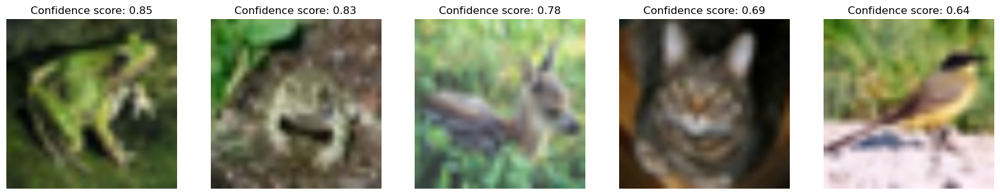

Class Frog: Bottom-5 Images:


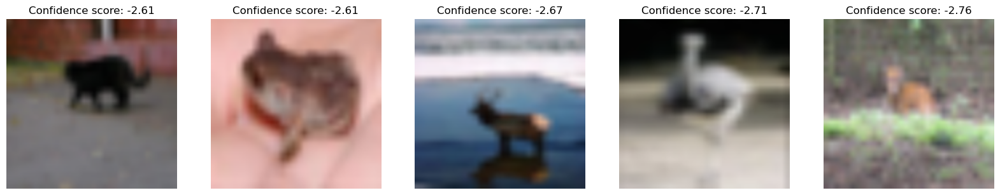

Class Automobile: Top-5 Images:


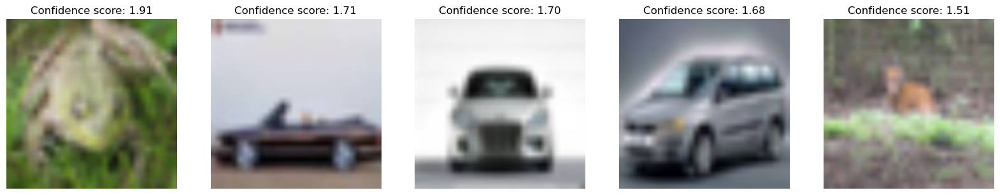

Class Automobile: Bottom-5 Images:


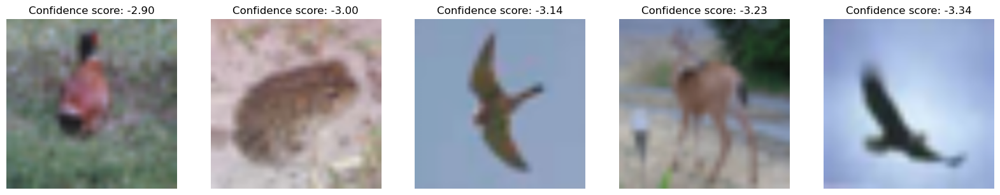

Class Bird: Top-5 Images:


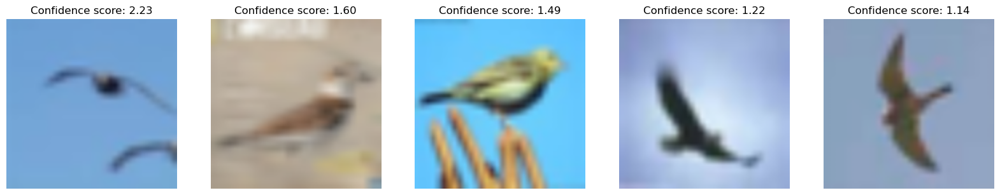

Class Bird: Bottom-5 Images:


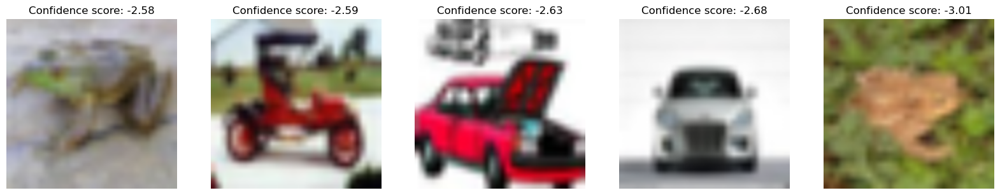

Class Cat: Top-5 Images:


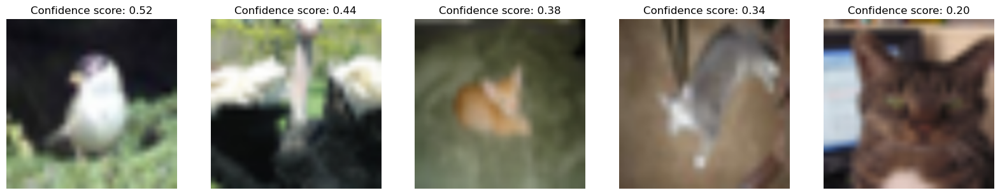

Class Cat: Bottom-5 Images:


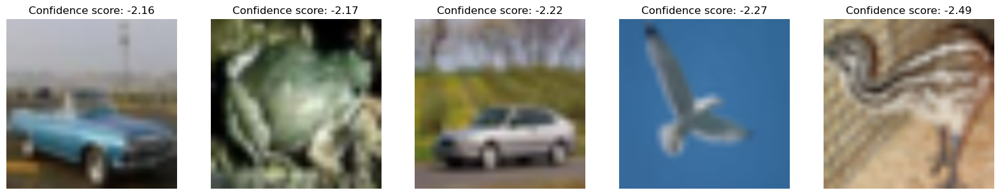

Class Deer: Top-5 Images:


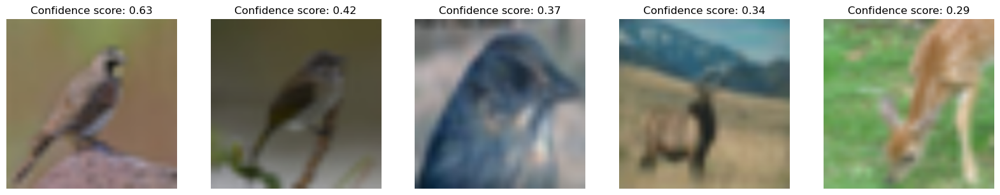

Class Deer: Bottom-5 Images:


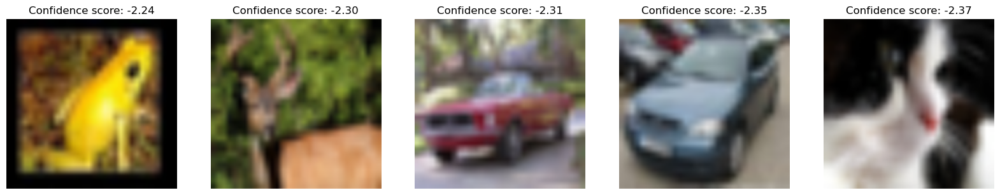

The Mean Average Precision (MAP) across all classes using SIFT: 0.3977736816058809
Class Frog: Top-5 Images:


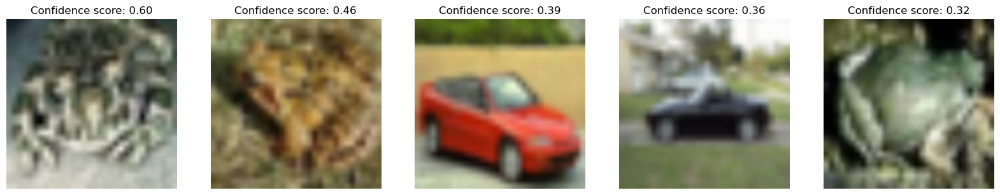

Class Frog: Bottom-5 Images:


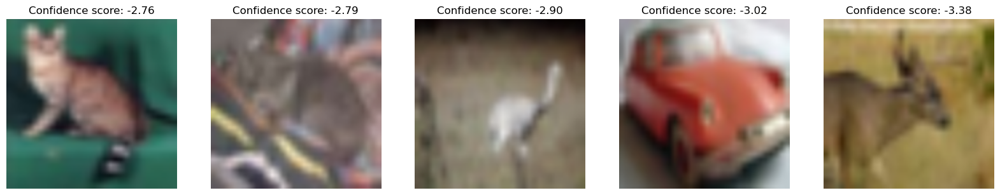

Class Automobile: Top-5 Images:


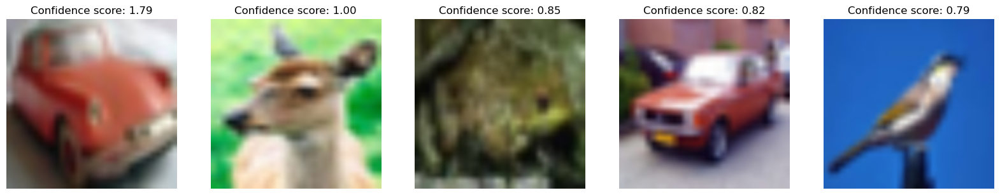

Class Automobile: Bottom-5 Images:


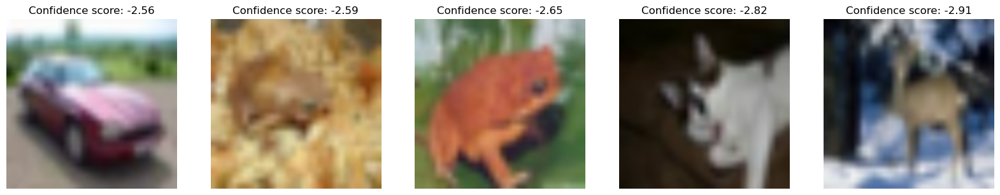

Class Bird: Top-5 Images:


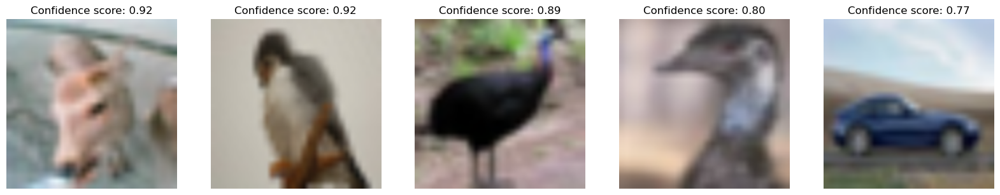

Class Bird: Bottom-5 Images:


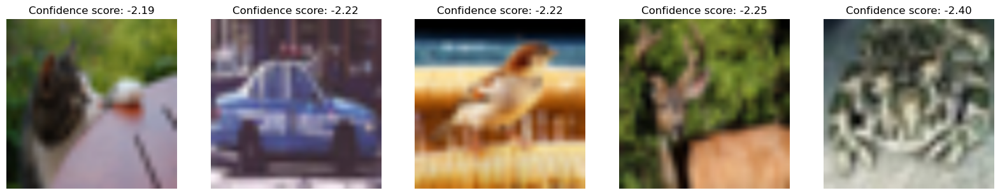

Class Cat: Top-5 Images:


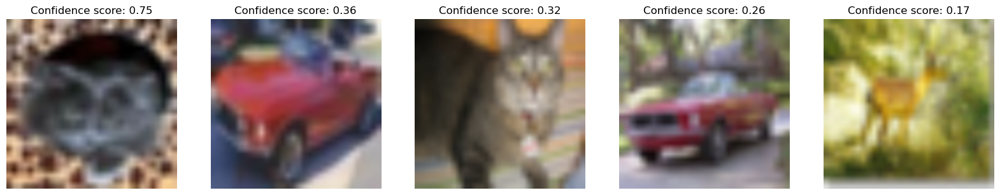

Class Cat: Bottom-5 Images:


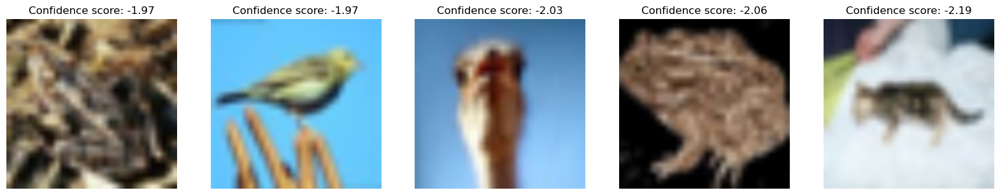

Class Deer: Top-5 Images:


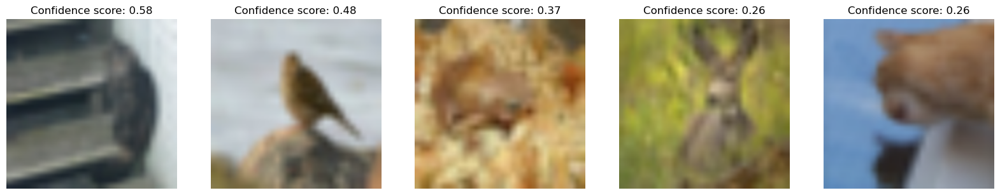

Class Deer: Bottom-5 Images:


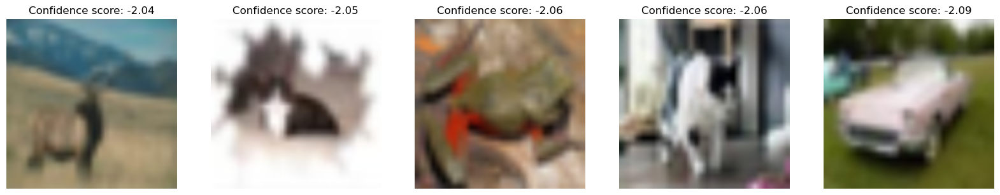

The Mean Average Precision (MAP) across all classes using ORB: 0.22941322075049347


In [54]:
map_sift = calculate_map(test_images, scores_sift, test_labels, num_classes, class_names, True)
print(f"The Mean Average Precision (MAP) across all classes using SIFT: {map_shift}")

map_orb = calculate_map(test_images, scores_orb, test_labels, num_classes, class_names, True)
print(f"The Mean Average Precision (MAP) across all classes using ORB: {map_orb}")

<a id="section-9"></a>
### **Section 9: Hyperparameter Search (16 points)**

In this section, the task is to perform an extensive hyperparameter search to optimize the performance of your classifiers. You will experiment with various parameters, including the number of visual words (e.g., 500, 1000, 1500), different training subset sizes (e.g., 30%, 40%, 50%), SVM parameters (e.g., kernel types like 'linear' or 'rbf', regularization parameter $C$ values such as 0.1, 1, 10, and gamma settings like 'scale' or specific values such as 0.01, 0.001), and settings of the feature extractors (e.g., the number of keypoints or scale levels). Start by testing your code on the smallest subset to ensure it functions correctly before proceeding with a full hyperparameter search. Once validated, conduct the search using larger subsets and systematically iterate through the different parameter combinations, potentially using nested loops or grid search. Be sure to record the performance results for each combination to identify the best settings based on metrics like the Mean Average Precision (mAP).

In [ ]:
train_histograms_sift_svm_30 = images_to_histograms(train_images, sift_clusters_30, 'sift', num_of_visual_words, cluster_mode)
train_histograms_sift40 = images_to_histograms(train_images, sift_clusters_40, 'sift', num_of_visual_words, cluster_mode)
train_histograms_sift50 = images_to_histograms(train_images, sift_clusters_50, 'sift', num_of_visual_words, cluster_mode)

In [43]:
from sklearn.model_selection import ParameterGrid
from tqdm.notebook import tqdm

parameters = {'num_of_visual_words': [500, 1000, 1500],
                   'train_subset': [30, 40, 50],
                   'kernel': ['linear', 'rbf'], 
                   'C': [0.1, 1, 10],
                   'gamma': [0.01, 0.001, 'scale']}

parameter_grid = ParameterGrid(parameters)

In [44]:
results_sift = []
for params in tqdm(parameter_grid, desc="parameter"):
    if params['train_subset'] == 30:
        images_bow = train_images_30_bow
        images_svm = train_images_70_svm
        labels_svm = train_labels_70_svm
    elif params['train_subset'] == 40:
        images_bow = train_images_40_bow
        images_svm = train_images_60_svm
        labels_svm = train_labels_60_svm
    elif params['train_subset'] == 50:
        images_bow = train_images_50_bow
        images_svm = train_images_50_svm
        labels_svm = train_labels_50_svm

    sift_descriptors, _, sift_clusters, _ = get_descriptors_and_clusters(images_bow, params['num_of_visual_words'], cluster_mode)
    
    train_histograms_sift_svm = images_to_histograms(images_svm, sift_clusters, 'sift', params['num_of_visual_words'], cluster_mode)
    test_histograms_sift_svm = images_to_histograms(test_images, sift_clusters, 'sift', params['num_of_visual_words'], cluster_mode)
    
    sift_svc = OneVsRestClassifier(SVC(kernel=params["kernel"], C=params["C"], gamma=params["gamma"], random_state=42))
    sift_svc.fit(train_histograms_sift_svm, labels_svm)
    scores_sift = sift_svc.decision_function(test_histograms_sift_svm)
    map_score = calculate_map(test_images, scores_sift, test_labels, num_classes, class_names, False)

    results_sift.append({'params': params, 'mAP': map_score})
    print(f"Parameters: {params}, mAP: {map_score}")

parameter:   0%|          | 0/162 [00:00<?, ?it/s]

Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.4304002774375159
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.4183829657870405
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.42169744133616593


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.4285581797292005


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.41599539036939664
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.40596139708692497


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.41042796544823756


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.4040082571910714


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.40268215940270646
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.4301709819467372
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.4133173054845972
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.42217311365956256


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.4251415150740233


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.41165566493780004
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.4038103329369426


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.4076023438700059


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.3990616196172305


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.40320381653638365
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.4304002774375159
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.4183829657870405
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.42169744133616593


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.4285581797292005


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.41599539036939664
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.40596139708692497


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.41042796544823756


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.4040082571910714


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.40268215940270646
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.4249311706389114
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.39675667170022244
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.3992552544279165


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.4180378178436593


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.40099373687057527
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.40301708716037865


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.4040582282257164


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.3988651006330965


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.39873669035866033
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.4304002774375159
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.4183829657870405
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.42169744133616593


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.4285581797292005


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.41599539036939664
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.40596139708692497


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.41042796544823756


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.4040082571910714


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.40268215940270646
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.4477757193270975
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.43727639256716666
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.43803588626157186


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.45008090550553137


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.4371241449334062
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.42727316233692536


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.4305218546694952


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.41776361183696176


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.4215670515740845
Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.42585646397800936
Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.4135173369086744
Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.41501952920170676


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.42469737900639776


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.40818724880886315
Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.3977736816058809


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.40338509275284107


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.40106655140382463


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.39333782312386145
Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.4291454400574075
Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.4175673680289004
Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.4217971746234407


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.42895078032682354


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.41611482291484847
Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.40593453233330523


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.4100952991806066


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.404045866879415


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.40260975181156733
Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.42585646397800936
Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.4135173369086744
Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.41501952920170676


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.42469737900639776


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.40818724880886315
Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.3977736816058809


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.40338509275284107


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.40106655140382463


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.39333782312386145
Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.4315659378399544
Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.4117131264426783
Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.42135297297751784


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.42620205720927506


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.41076303010909215
Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.40038706407122354


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.4097907146535846


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.4013555669344358


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.39745685190030267
Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.42585646397800936
Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.4135173369086744
Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.41501952920170676


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.42469737900639776


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.40818724880886315
Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.3977736816058809


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.40338509275284107


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.40106655140382463


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.39333782312386145
Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.4470272751650336
Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.43650876003808214
Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.4363260276094862


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.4527994532719245


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.4364021106266579
Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.4268728071479696


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.4292909357888214


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.4201269916376611


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.42228151075669074
Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.39495156706638124
Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.3980970254983805
Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.38438502157240134


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.38486071675848593


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.35105905479165583
Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.3369388179629308


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.33641177021071295


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.3472157808975486


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.33727865612435604
Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.43106760810459105
Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.4184686842243107
Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.42171339360465876


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.4289830838450019


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.41597454846279913
Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.4064066002993121


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.4103855906567907


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.40453020989258864


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.40290588493575186
Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.39495156706638124
Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.3980970254983805
Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.38438502157240134


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.38486071675848593


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.35105905479165583
Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.3369388179629308


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.33641177021071295


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.3472157808975486


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.33727865612435604
Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.42879214026285634
Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.418197002350587
Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.42179572798515536


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.4284747885320348


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.41554997805038346
Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.40555139843740023


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.40983230393009257


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.4038094829596103


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.40328937311556085
Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.39495156706638124
Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.3980970254983805
Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.38438502157240134


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.38486071675848593


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.35105905479165583
Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.3369388179629308


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.33641177021071295


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.3472157808975486


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.33727865612435604
Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.43791649602422567
Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.4345630700875862
Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.42934571967842305


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.44571473074939644


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.42998560126205004
Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.4130923725727363


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.41865619440213164


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.41382715239093615


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.41095191254760166


In [45]:
results_sift

[{'params': {'C': 0.1,
   'gamma': 0.01,
   'kernel': 'linear',
   'num_of_visual_words': 500,
   'train_subset': 30},
  'mAP': 0.4304002774375159},
 {'params': {'C': 0.1,
   'gamma': 0.01,
   'kernel': 'linear',
   'num_of_visual_words': 500,
   'train_subset': 40},
  'mAP': 0.4183829657870405},
 {'params': {'C': 0.1,
   'gamma': 0.01,
   'kernel': 'linear',
   'num_of_visual_words': 500,
   'train_subset': 50},
  'mAP': 0.42169744133616593},
 {'params': {'C': 0.1,
   'gamma': 0.01,
   'kernel': 'linear',
   'num_of_visual_words': 1000,
   'train_subset': 30},
  'mAP': 0.4285581797292005},
 {'params': {'C': 0.1,
   'gamma': 0.01,
   'kernel': 'linear',
   'num_of_visual_words': 1000,
   'train_subset': 40},
  'mAP': 0.41599539036939664},
 {'params': {'C': 0.1,
   'gamma': 0.01,
   'kernel': 'linear',
   'num_of_visual_words': 1000,
   'train_subset': 50},
  'mAP': 0.40596139708692497},
 {'params': {'C': 0.1,
   'gamma': 0.01,
   'kernel': 'linear',
   'num_of_visual_words': 1500,
   '

In [ ]:
results_orb = []
for params in tqdm(parameter_grid, desc="parameter"):
    if params['train_subset'] == 30:
        images_bow = train_images_30_bow
        images_svm = train_images_70_svm
        labels_svm = train_labels_70_svm
    elif params['train_subset'] == 40:
        images_bow = train_images_40_bow
        images_svm = train_images_60_svm
        labels_svm = train_labels_60_svm
    elif params['train_subset'] == 50:
        images_bow = train_images_50_bow
        images_svm = train_images_50_svm
        labels_svm = train_labels_50_svm

    _, orb_descriptors, _, orb_clusters = get_descriptors_and_clusters(images_bow, params['num_of_visual_words'], cluster_mode)
    
    train_histograms_orb_svm = images_to_histograms(images_svm, orb_clusters, 'orb', params['num_of_visual_words'], cluster_mode)
    test_histograms_orb_svm = images_to_histograms(test_images, orb_clusters, 'orb', params['num_of_visual_words'], cluster_mode)
    
    orb_svc = OneVsRestClassifier(SVC(kernel=params["kernel"], C=params["C"], gamma=params["gamma"], random_state=42))
    orb_svc.fit(train_histograms_orb_svm, labels_svm)
    scores_orb = orb_svc.decision_function(test_histograms_orb_svm)
    map_score = calculate_map(test_images, scores_orb, test_labels, num_classes, class_names, False)

    results_orb.append({'params': params, 'mAP': map_score})
    print(f"Parameters: {params}, mAP: {map_score}")

parameter:   0%|          | 0/162 [00:00<?, ?it/s]

Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.2678292808914064
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.23842908157523865
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.2460411452121761


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.24436398412752328


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.25313306101383704
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.2546237811820736


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.24331169621095503


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.2439373340374989


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.2579092073311853
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.26259310335813624
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.2436922278643332
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.24610784112310777


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.24254657038577565


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.25773870832097184
Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.25410926828236835


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.24946153186450784


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.24663100042264255


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.2581195780722982
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.2678292808914064
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.23842908157523865
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.2460411452121761


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.24436398412752328


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.25313306101383704
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.2546237811820736


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.24331169621095503


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.2439373340374989


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.2579092073311853
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.2584629189334898
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.2315484483498651
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.24682682334494838


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.24162046124876552


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.2552454264078
Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.24837159371500256


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.24103976540562533


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.24529679543809296


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.25941514637390356
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.2678292808914064
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.23842908157523865
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.2460411452121761


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.24436398412752328


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.25313306101383704
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.2546237811820736


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.24331169621095503


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.2439373340374989


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.2579092073311853
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.2762251430800229
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.2597382248105402
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 500, 'train_subset': 50}, mAP: 0.2584645597903183


WARNING clustering 25959 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 30}, mAP: 0.26260564644972473


WARNING clustering 34830 points to 1000 centroids: please provide at least 39000 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 40}, mAP: 0.26493882126597423
Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1000, 'train_subset': 50}, mAP: 0.27191085067273646


WARNING clustering 51458 points to 1500 centroids: please provide at least 58500 training points
WARNING clustering 25959 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 30}, mAP: 0.2544274267056562


WARNING clustering 34830 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 40}, mAP: 0.2570004604973539


WARNING clustering 43383 points to 1500 centroids: please provide at least 58500 training points


Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'num_of_visual_words': 1500, 'train_subset': 50}, mAP: 0.26644457292912244
Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 30}, mAP: 0.26403635693043126
Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear', 'num_of_visual_words': 500, 'train_subset': 40}, mAP: 0.23817268375792774


<a id="section-10"></a>
### **Section 10: Using CLIP for Image Classification (5 points)**

**<span style="color:red">⚠️ NOTE: This section should NOT be included in the report. It is only meant to be completed in the code cells. The purpose of this task is to introduce you to a more state-of-the-art model (CLIP) compared to Bag of Visual Words (BoVW). Vision Transformers (ViT) will be covered in more detail in the Deep Learning 1 course next period!</span>**

In this section, you will use a pre-trained CLIP model for image classification. CLIP (Contrastive Language-Image Pretraining) is a vision-language transformer model trained on a large dataset of images and text. It consists of two main components: a Vision Transformer (ViT) and a text Transformer. The ViT encodes images by dividing them into patches (tokens), flattening each patch into a vector, and passing them through a sequence of Transformer layers to produce an encoded representation of the image.

For this task, you will use the visual transformer component of CLIP to extract encoded representations of the input images. While this is not the typical way to use CLIP (which involves encoding both images and text for similarity comparison), it provides an interesting application of this state-of-the-art model for image classification.

**To Install CLIP:**
```python
pip install git+https://github.com/openai/CLIP.git
```

**Additional Reading (if you're interested):**
- [OpenAI CLIP Overview](https://openai.com/clip)
- [Vision Transformer (ViT) Paper](https://arxiv.org/abs/2010.11929)
- [Tutorial on Vision Transformers](https://d2l.ai/chapter_attention-mechanisms-and-transformers/vision-transformer.html)
- [UvA's Deep Learning Introduction to ViTs](https://uvadlc-notebooks.readthedocs.io/en/latest/tutorial_notebooks/tutorial15/Vision_Transformer.html)

First, create DataLoaders for both the training and test datasets by filtering the CIFAR-10 dataset to include only the selected classes: frog, automobile, bird, cat, and deer. Use a batch size of 16 for both DataLoaders, and resize the images to 224x224 to match the input size requirements for CLIP. Remember to normalize the images using the appropriate mean and standard deviation. Use a training set size of 1000 images per class and a test set size of 200 images per class.

In [11]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Define the class indices for the 5 selected classes: frog, automobile, bird, cat, and deer
selected_classes = [6, 1, 2, 3, 4]  # 6: frog, 1: automobile, 2: bird, 3: cat, 4: deer
class_to_label = {orig_class: new_label for new_label, orig_class in enumerate(selected_classes)}

# Load the CIFAR-10 training set
train_set = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)

# Filter and remap training set
filtered_train_set, train_mapped_labels = filter_dataset(train_set, 1000, selected_classes, class_to_label)

# Load the CIFAR-10 test set
test_set = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# Filter and remap test set
filtered_test_set, test_mapped_labels = filter_dataset(test_set, 200, selected_classes, class_to_label)

# Create data loaders for the filtered datasets
train_data_loader = DataLoader(filtered_train_set, batch_size=16, shuffle=False)
test_data_loader = DataLoader(filtered_test_set, batch_size=16, shuffle=False)

Files already downloaded and verified
Files already downloaded and verified


Next, we load a pre-trained CLIP model, which is a vision-language transformer designed to predict the text that describes an image and vice versa. The model consists of two components: a Vision Transformer (ViT) for encoding images and a text Transformer for encoding text. 

In [12]:
import clip

# Setup the model and the preprocessor
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the pre-trained CLIP model
model, preprocess = clip.load("ViT-B/32", device=device)

To extract the visual tokens using the CLIP model, start by initializing two empty lists: one for storing the image features and another for the labels. Use `tqdm` to create a progress bar that tracks the extraction process over the DataLoader. Iterate through the DataLoader, extracting images and labels. Disable gradient computation, and then encode the images with `model.encode_image(images)`. Append the encoded features and labels to their respective lists. Remember, the output from the model will have the shape `(batch_size, 512)` due to batched processing, if your are using a single you should reshape the output to `(512,)` to remove the batch dimension.

In this example, we will use the class token as the visual representation of the image. The class token is a 512-dimensional vector that represents the image. We will use this vector to train a classifier to classify the images.

**Note:** The CLIP model is quite large and may take some time to extract features from the images. You can use the `tqdm` library to create a progress bar that shows the extraction progress. It is recommended to test the code with a smaller subset of images to ensure it functions correctly before running it on the full dataset. With the default batch size of 16 and a training set size of 1000 images, the extraction process may take a 10-20 minutes.

In [13]:
import torch
from tqdm.notebook import tqdm

image_features_list = []
target_labels_list = []

with torch.no_grad():
    for images, labels in tqdm(train_data_loader, desc="Extracting features"):
        images = images.to(device)
        labels = labels.to(device)

        image_features = model.encode_image(images)

        image_features_list.append(image_features)
        target_labels_list.append(labels)

Extracting features:   0%|          | 0/313 [00:00<?, ?it/s]

In [18]:
# Stack the (batched) visual tokens extracted from the images. The resulting shape will be (number_of_images, 512).
stacked_image_features = torch.cat(image_features_list)
stacked_target_labels = torch.cat(target_labels_list)

To train a classifier using the visual tokens, start by initializing an SVM classifier using `SVC()` from `scikit-learn`. You can play around with different hyperparameters such as kernel type, regularization parameter, and gamma to find the best configuration. Finally, use the `fit` method to train the classifier on the visual image features and labels.

In [21]:
svm_classifier = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)
svm_classifier.fit(stacked_image_features.cpu().detach().numpy(), stacked_target_labels.cpu().detach().numpy())

SVC(random_state=42)

To evaluate the classifier, start by extracting the visual tokens from the test images using the same method applied to the training set. Loop through the test DataLoader, encode each batch of images using the model (e.g., `model.encode_image(images)`), and store the results in separate lists for the features and labels. After extracting all the features, stack them into a single tensor for both the features and labels. This process will prepare the test data for use in evaluating the classifier's performance.

In [22]:
test_image_features_list = []
test_target_labels_list = []

with torch.no_grad():
    for images, labels in tqdm(test_data_loader):
        images = images.to(device)
        labels = labels.to(device)

        image_features = model.encode_image(images)

        test_image_features_list.append(image_features)
        test_target_labels_list.append(labels)

stacked_test_image_features = torch.cat(test_image_features_list)
stacked_test_target_labels = torch.cat(test_target_labels_list)

  0%|          | 0/63 [00:00<?, ?it/s]

To evaluate the performance of your classifier, use the test set features you extracted earlier. First, generate predictions for the test set by passing the stacked test features into your trained classifier's `predict` method. Next, use the `classification_report` function from `sklearn.metrics` to create a detailed report that includes metrics such as precision, recall, and F1-score for each class. Finally, print the report to analyze how well your classifier performs across the different classes.

In [23]:
from sklearn.metrics import classification_report

predicted_labels = svm_classifier.predict(stacked_test_image_features.cpu().detach().numpy())

print(classification_report(stacked_test_target_labels.cpu().detach().numpy(), predicted_labels))

              precision    recall  f1-score   support

           1       1.00      0.99      0.99       200
           2       0.94      0.92      0.93       200
           3       0.93      0.94      0.94       200
           4       0.94      0.91      0.93       200
           6       0.91      0.95      0.93       200

    accuracy                           0.94      1000
   macro avg       0.94      0.94      0.94      1000
weighted avg       0.94      0.94      0.94      1000



<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
| Jose | 33 % | 33 % | 33 % |
| Lisanne | 33 % | 33 % | 33 % |
| Julio | 33 % | 33 % | 33 % |

### - End of Notebook -